In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 12

# for the filename
parameters = "2-0_5-t12"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 71.79674577713013
My own part is done: 2.53204083442688
Time for data preperation:  211.93722438812256


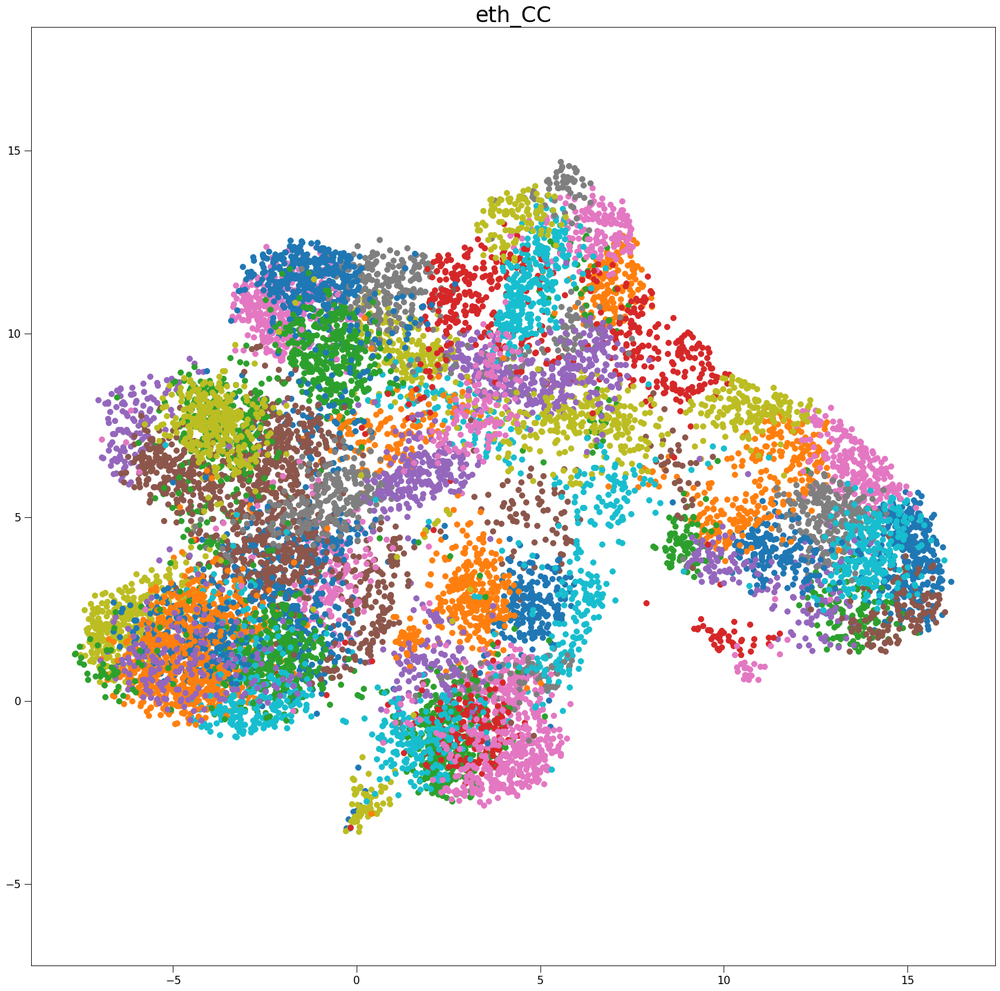

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [9]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/83 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/554 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/554 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/554 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 554 -> 498
update Arr 498 -> 444
update Arr 444 -> 396
update Arr 396 -> 358
update Arr 358 -> 316
update Arr 316 -> 280
update Arr 280 -> 254
update Arr 254 -> 229
update Arr 229 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 70
update Arr 70 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1483 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1483 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1483 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 1483 -> 1335
update Arr 1335 -> 1209
update Arr 1209 -> 1084
update Arr 1084 -> 984
update Arr 984 -> 886
update Arr 886 -> 800
update Arr 800 -> 727
update Arr 727 -> 660
update Arr 660 -> 598
update Arr 598 -> 543
update Arr 543 -> 492
update Arr 492 -> 438
update Arr 438 -> 397
update Arr 397 -> 356
update Arr 356 -> 322
update Arr 322 -> 292
update Arr 292 -> 262
update Arr 262 -> 238
update Arr 238 -> 204
update Arr 204 -> 184
update Arr 184 -> 164
update Arr 164 -> 162
update Arr 162 -> 160
update Arr 160 -> 158
update Arr 158 -> 155


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1516 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1516 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1516 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 1516 -> 1374
update Arr 1374 -> 1247
update Arr 1247 -> 1127
update Arr 1127 -> 1021
update Arr 1021 -> 925
update Arr 925 -> 834
update Arr 834 -> 757
update Arr 757 -> 688
update Arr 688 -> 624
update Arr 624 -> 558
update Arr 558 -> 501
update Arr 501 -> 449
update Arr 449 -> 402
update Arr 402 -> 361
update Arr 361 -> 324
update Arr 324 -> 294
update Arr 294 -> 265
update Arr 265 -> 238
update Arr 238 -> 214
update Arr 214 -> 185
update Arr 185 -> 176
update Arr 176 -> 174
update Arr 174 -> 173
update Arr 173 -> 171
update Arr 171 -> 169
update Arr 169 -> 168
update Arr 168 -> 167


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1542 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1542 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1542 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 1542 -> 1362
update Arr 1362 -> 1232
update Arr 1232 -> 1117
update Arr 1117 -> 1012
update Arr 1012 -> 916
update Arr 916 -> 827
update Arr 827 -> 749
update Arr 749 -> 676
update Arr 676 -> 612
update Arr 612 -> 547
update Arr 547 -> 495
update Arr 495 -> 448
update Arr 448 -> 407
update Arr 407 -> 354
update Arr 354 -> 321
update Arr 321 -> 283
update Arr 283 -> 257
update Arr 257 -> 230
update Arr 230 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 159
update Arr 159 -> 158
update Arr 158 -> 157
update Arr 157 -> 156
update Arr 156 -> 155
update Arr 155 -> 154


calculating the densities for the density criterion:   0%|          | 0/209 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1945 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1945 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1945 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/208 [00:00<?, ?it/s]

update Arr 1945 -> 1765
added 3 edges early
update Arr 1765 -> 1579
update Arr 1579 -> 1434
update Arr 1434 -> 1301
update Arr 1301 -> 1174
update Arr 1174 -> 1065
update Arr 1065 -> 968
update Arr 968 -> 874
update Arr 874 -> 788
update Arr 788 -> 707
update Arr 707 -> 639
update Arr 639 -> 576
update Arr 576 -> 520
update Arr 520 -> 472
update Arr 472 -> 428
update Arr 428 -> 388
update Arr 388 -> 351
update Arr 351 -> 317
update Arr 317 -> 288
update Arr 288 -> 261
update Arr 261 -> 234
update Arr 234 -> 218
update Arr 218 -> 213
update Arr 213 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 209


calculating the densities for the density criterion:   0%|          | 0/367 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3731 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3731 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3731 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/366 [00:00<?, ?it/s]

update Arr 3731 -> 3347
added 8 edges early
update Arr 3347 -> 3041
update Arr 3041 -> 2731
update Arr 2731 -> 2481
update Arr 2481 -> 2252
update Arr 2252 -> 2044
update Arr 2044 -> 1855
update Arr 1855 -> 1686
update Arr 1686 -> 1527
update Arr 1527 -> 1385
update Arr 1385 -> 1259
update Arr 1259 -> 1144
update Arr 1144 -> 1039
update Arr 1039 -> 939
update Arr 939 -> 853
update Arr 853 -> 767
update Arr 767 -> 691
update Arr 691 -> 627
update Arr 627 -> 569
update Arr 569 -> 514
update Arr 514 -> 454
update Arr 454 -> 402
update Arr 402 -> 375
update Arr 375 -> 373
update Arr 373 -> 371
update Arr 371 -> 368
update Arr 368 -> 368
update Arr 368 -> 367
update Arr 367 -> 367


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1250 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 1250 -> 1115
update Arr 1115 -> 1011
update Arr 1011 -> 908
update Arr 908 -> 818
update Arr 818 -> 743
update Arr 743 -> 675
update Arr 675 -> 606
update Arr 606 -> 549
update Arr 549 -> 485
update Arr 485 -> 439
update Arr 439 -> 392
update Arr 392 -> 345
update Arr 345 -> 311
update Arr 311 -> 276
update Arr 276 -> 248
update Arr 248 -> 220
update Arr 220 -> 188
update Arr 188 -> 169
update Arr 169 -> 153
update Arr 153 -> 134
added 2 edges early
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 132
update Arr 132 -> 130
update Arr 130 -> 129
update Arr 129 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/247 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2450 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2450 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2450 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/246 [00:00<?, ?it/s]

update Arr 2450 -> 2218
added 7 edges early
update Arr 2218 -> 2015
update Arr 2015 -> 1806
update Arr 1806 -> 1628
update Arr 1628 -> 1475
update Arr 1475 -> 1337
update Arr 1337 -> 1211
update Arr 1211 -> 1098
update Arr 1098 -> 994
update Arr 994 -> 901
update Arr 901 -> 815
update Arr 815 -> 735
update Arr 735 -> 665
update Arr 665 -> 601
update Arr 601 -> 545
update Arr 545 -> 494
update Arr 494 -> 449
update Arr 449 -> 403
update Arr 403 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 268
update Arr 268 -> 255
update Arr 255 -> 252
update Arr 252 -> 250
update Arr 250 -> 248
update Arr 248 -> 247


calculating the densities for the density criterion:   0%|          | 0/238 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2371 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2371 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2371 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/237 [00:00<?, ?it/s]

update Arr 2371 -> 2154
added 4 edges early
update Arr 2154 -> 1926
update Arr 1926 -> 1745
update Arr 1745 -> 1570
update Arr 1570 -> 1426
update Arr 1426 -> 1294
update Arr 1294 -> 1171
update Arr 1171 -> 1061
update Arr 1061 -> 963
update Arr 963 -> 873
update Arr 873 -> 787
update Arr 787 -> 706
update Arr 706 -> 637
update Arr 637 -> 573
update Arr 573 -> 516
update Arr 516 -> 466
update Arr 466 -> 422
update Arr 422 -> 374
update Arr 374 -> 334
update Arr 334 -> 303
update Arr 303 -> 273
update Arr 273 -> 246
update Arr 246 -> 245
update Arr 245 -> 238
added 3 edges early
update Arr 238 -> 238
update Arr 238 -> 237


calculating the densities for the density criterion:   0%|          | 0/129 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1197 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/128 [00:00<?, ?it/s]

update Arr 1197 -> 1085
added 4 edges early
update Arr 1085 -> 978
update Arr 978 -> 871
update Arr 871 -> 790
update Arr 790 -> 712
update Arr 712 -> 640
update Arr 640 -> 577
update Arr 577 -> 518
update Arr 518 -> 468
update Arr 468 -> 425
update Arr 425 -> 380
update Arr 380 -> 339
update Arr 339 -> 305
update Arr 305 -> 275
update Arr 275 -> 245
update Arr 245 -> 218
update Arr 218 -> 197
update Arr 197 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 136
update Arr 136 -> 134
update Arr 134 -> 133
update Arr 133 -> 131
update Arr 131 -> 130
update Arr 130 -> 129


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1021 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1021 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1021 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 1021 -> 894
update Arr 894 -> 775
update Arr 775 -> 703
update Arr 703 -> 633
update Arr 633 -> 568
update Arr 568 -> 508
update Arr 508 -> 461
update Arr 461 -> 417
update Arr 417 -> 379
update Arr 379 -> 340
update Arr 340 -> 300
update Arr 300 -> 272
update Arr 272 -> 241
update Arr 241 -> 219
update Arr 219 -> 193
update Arr 193 -> 174
update Arr 174 -> 152
update Arr 152 -> 137
update Arr 137 -> 121
update Arr 121 -> 115
update Arr 115 -> 115
update Arr 115 -> 114
update Arr 114 -> 113
update Arr 113 -> 111


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1428 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1428 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1428 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 1428 -> 1295
added 2 edges early
update Arr 1295 -> 1150
update Arr 1150 -> 1039
update Arr 1039 -> 944
update Arr 944 -> 855
update Arr 855 -> 775
update Arr 775 -> 699
update Arr 699 -> 629
update Arr 629 -> 563
update Arr 563 -> 507
update Arr 507 -> 457
update Arr 457 -> 406
update Arr 406 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 272
update Arr 272 -> 243
update Arr 243 -> 218
update Arr 218 -> 196
update Arr 196 -> 175
update Arr 175 -> 162
update Arr 162 -> 160
update Arr 160 -> 157
update Arr 157 -> 156
update Arr 156 -> 154


calculating the densities for the density criterion:   0%|          | 0/240 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2368 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2368 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2368 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/239 [00:00<?, ?it/s]

update Arr 2368 -> 2141
added 2 edges early
update Arr 2141 -> 1936
update Arr 1936 -> 1731
update Arr 1731 -> 1572
update Arr 1572 -> 1426
update Arr 1426 -> 1294
update Arr 1294 -> 1172
update Arr 1172 -> 1060
update Arr 1060 -> 954
update Arr 954 -> 861
update Arr 861 -> 772
update Arr 772 -> 699
update Arr 699 -> 630
update Arr 630 -> 569
update Arr 569 -> 514
update Arr 514 -> 459
update Arr 459 -> 414
update Arr 414 -> 375
update Arr 375 -> 336
update Arr 336 -> 303
update Arr 303 -> 271
update Arr 271 -> 248
update Arr 248 -> 239
added 8 edges early


calculating the densities for the density criterion:   0%|          | 0/304 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2961 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2961 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2961 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/303 [00:00<?, ?it/s]

update Arr 2961 -> 2686
added 4 edges early
update Arr 2686 -> 2431
update Arr 2431 -> 2209
update Arr 2209 -> 2006
update Arr 2006 -> 1819
update Arr 1819 -> 1648
update Arr 1648 -> 1495
update Arr 1495 -> 1358
update Arr 1358 -> 1231
update Arr 1231 -> 1114
update Arr 1114 -> 1010
update Arr 1010 -> 918
update Arr 918 -> 829
update Arr 829 -> 753
update Arr 753 -> 684
update Arr 684 -> 618
update Arr 618 -> 555
update Arr 555 -> 503
update Arr 503 -> 454
update Arr 454 -> 405
update Arr 405 -> 367
update Arr 367 -> 331
update Arr 331 -> 312
update Arr 312 -> 310
update Arr 310 -> 307
update Arr 307 -> 305
update Arr 305 -> 304


calculating the densities for the density criterion:   0%|          | 0/264 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2504 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2504 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2504 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/263 [00:00<?, ?it/s]

update Arr 2504 -> 2266
added 2 edges early
update Arr 2266 -> 2058
update Arr 2058 -> 1869
update Arr 1869 -> 1698
update Arr 1698 -> 1536
update Arr 1536 -> 1393
update Arr 1393 -> 1266
update Arr 1266 -> 1147
update Arr 1147 -> 1041
update Arr 1041 -> 942
update Arr 942 -> 852
update Arr 852 -> 770
update Arr 770 -> 693
update Arr 693 -> 625
update Arr 625 -> 567
update Arr 567 -> 515
update Arr 515 -> 462
update Arr 462 -> 417
update Arr 417 -> 370
update Arr 370 -> 331
update Arr 331 -> 300
update Arr 300 -> 273
update Arr 273 -> 272
update Arr 272 -> 270
update Arr 270 -> 269
update Arr 269 -> 268
update Arr 268 -> 267
update Arr 267 -> 266
update Arr 266 -> 266
update Arr 266 -> 265
update Arr 265 -> 264


calculating the densities for the density criterion:   0%|          | 0/225 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2147 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/224 [00:00<?, ?it/s]

update Arr 2147 -> 1942
added 3 edges early
update Arr 1942 -> 1737
update Arr 1737 -> 1577
update Arr 1577 -> 1433
update Arr 1433 -> 1293
update Arr 1293 -> 1170
update Arr 1170 -> 1058
update Arr 1058 -> 954
update Arr 954 -> 864
update Arr 864 -> 777
update Arr 777 -> 706
update Arr 706 -> 640
update Arr 640 -> 572
update Arr 572 -> 515
update Arr 515 -> 459
update Arr 459 -> 413
update Arr 413 -> 374
update Arr 374 -> 336
update Arr 336 -> 305
update Arr 305 -> 276
update Arr 276 -> 250
update Arr 250 -> 234
update Arr 234 -> 231
update Arr 231 -> 230
update Arr 230 -> 227
update Arr 227 -> 227
update Arr 227 -> 225


calculating the densities for the density criterion:   0%|          | 0/227 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2258 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/226 [00:00<?, ?it/s]

update Arr 2258 -> 2047
added 3 edges early
update Arr 2047 -> 1837
update Arr 1837 -> 1665
update Arr 1665 -> 1511
update Arr 1511 -> 1369
update Arr 1369 -> 1242
update Arr 1242 -> 1125
update Arr 1125 -> 1019
update Arr 1019 -> 920
update Arr 920 -> 830
update Arr 830 -> 747
update Arr 747 -> 676
update Arr 676 -> 612
update Arr 612 -> 553
update Arr 553 -> 501
update Arr 501 -> 452
update Arr 452 -> 406
update Arr 406 -> 369
update Arr 369 -> 332
update Arr 332 -> 299
update Arr 299 -> 268
update Arr 268 -> 243
update Arr 243 -> 236
update Arr 236 -> 233
update Arr 233 -> 231
update Arr 231 -> 229
update Arr 229 -> 228
update Arr 228 -> 227


calculating the densities for the density criterion:   0%|          | 0/16 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/109 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


calculating the densities for the density criterion:   0%|          | 0/217 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2122 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/216 [00:00<?, ?it/s]

update Arr 2122 -> 1878
update Arr 1878 -> 1707
update Arr 1707 -> 1551
update Arr 1551 -> 1404
update Arr 1404 -> 1273
update Arr 1273 -> 1154
update Arr 1154 -> 1049
update Arr 1049 -> 951
update Arr 951 -> 862
update Arr 862 -> 781
update Arr 781 -> 699
update Arr 699 -> 635
update Arr 635 -> 572
update Arr 572 -> 511
update Arr 511 -> 463
update Arr 463 -> 416
update Arr 416 -> 360
update Arr 360 -> 326
update Arr 326 -> 293
update Arr 293 -> 259
update Arr 259 -> 235
update Arr 235 -> 225
update Arr 225 -> 224
update Arr 224 -> 222
update Arr 222 -> 220
update Arr 220 -> 219
update Arr 219 -> 217


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/741 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/741 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/741 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 741 -> 668
update Arr 668 -> 592
update Arr 592 -> 535
update Arr 535 -> 484
update Arr 484 -> 431
update Arr 431 -> 388
update Arr 388 -> 350
update Arr 350 -> 311
update Arr 311 -> 272
update Arr 272 -> 237
update Arr 237 -> 215
update Arr 215 -> 193
update Arr 193 -> 166
update Arr 166 -> 147
update Arr 147 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 91
update Arr 91 -> 89
update Arr 89 -> 87
update Arr 87 -> 85
update Arr 85 -> 83
update Arr 83 -> 80


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/851 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/851 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/851 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 851 -> 767
update Arr 767 -> 687
update Arr 687 -> 617
update Arr 617 -> 557
update Arr 557 -> 504
update Arr 504 -> 456
update Arr 456 -> 406
update Arr 406 -> 363
update Arr 363 -> 325
update Arr 325 -> 293
update Arr 293 -> 264
update Arr 264 -> 237
update Arr 237 -> 215
update Arr 215 -> 190
update Arr 190 -> 169
update Arr 169 -> 145
update Arr 145 -> 131
update Arr 131 -> 111
update Arr 111 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 98


calculating the densities for the density criterion:   0%|          | 0/322 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3090 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3090 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3090 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/321 [00:00<?, ?it/s]

update Arr 3090 -> 2808
added 4 edges early
update Arr 2808 -> 2536
update Arr 2536 -> 2301
update Arr 2301 -> 2081
update Arr 2081 -> 1890
update Arr 1890 -> 1712
update Arr 1712 -> 1554
update Arr 1554 -> 1399
update Arr 1399 -> 1269
update Arr 1269 -> 1151
update Arr 1151 -> 1044
update Arr 1044 -> 949
update Arr 949 -> 862
update Arr 862 -> 778
update Arr 778 -> 704
update Arr 704 -> 639
update Arr 639 -> 577
update Arr 577 -> 523
update Arr 523 -> 465
update Arr 465 -> 417
update Arr 417 -> 376
update Arr 376 -> 339
update Arr 339 -> 331
update Arr 331 -> 331
update Arr 331 -> 327
update Arr 327 -> 327
update Arr 327 -> 326
update Arr 326 -> 324
update Arr 324 -> 323
update Arr 323 -> 322


calculating the densities for the density criterion:   0%|          | 0/65 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/623 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/623 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/623 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/64 [00:00<?, ?it/s]

update Arr 623 -> 565
update Arr 565 -> 495
update Arr 495 -> 446
update Arr 446 -> 391
update Arr 391 -> 347
update Arr 347 -> 311
update Arr 311 -> 268
update Arr 268 -> 238
update Arr 238 -> 207
update Arr 207 -> 186
update Arr 186 -> 167
update Arr 167 -> 143
update Arr 143 -> 119
update Arr 119 -> 106
update Arr 106 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 68
update Arr 68 -> 68
update Arr 68 -> 66


calculating the densities for the density criterion:   0%|          | 0/193 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1879 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1879 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1879 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/192 [00:00<?, ?it/s]

update Arr 1879 -> 1697
update Arr 1697 -> 1521
update Arr 1521 -> 1380
update Arr 1380 -> 1251
update Arr 1251 -> 1135
update Arr 1135 -> 1027
update Arr 1027 -> 933
update Arr 933 -> 847
update Arr 847 -> 761
update Arr 761 -> 688
update Arr 688 -> 614
update Arr 614 -> 555
update Arr 555 -> 500
update Arr 500 -> 448
update Arr 448 -> 400
update Arr 400 -> 363
update Arr 363 -> 327
update Arr 327 -> 292
update Arr 292 -> 262
update Arr 262 -> 232
update Arr 232 -> 209
update Arr 209 -> 198
update Arr 198 -> 197
update Arr 197 -> 197
update Arr 197 -> 196
update Arr 196 -> 195
update Arr 195 -> 194
update Arr 194 -> 193


calculating the densities for the density criterion:   0%|          | 0/162 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1482 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1482 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1482 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 1482 -> 1338
update Arr 1338 -> 1212
update Arr 1212 -> 1095
update Arr 1095 -> 994
update Arr 994 -> 899
update Arr 899 -> 810
update Arr 810 -> 735
update Arr 735 -> 668
update Arr 668 -> 602
update Arr 602 -> 545
update Arr 545 -> 493
update Arr 493 -> 440
update Arr 440 -> 394
update Arr 394 -> 355
update Arr 355 -> 321
update Arr 321 -> 284
update Arr 284 -> 257
update Arr 257 -> 229
update Arr 229 -> 203
update Arr 203 -> 182
update Arr 182 -> 168
update Arr 168 -> 168
update Arr 168 -> 167
update Arr 167 -> 164
update Arr 164 -> 163
update Arr 163 -> 162


calculating the densities for the density criterion:   0%|          | 0/256 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2564 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2564 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2564 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/255 [00:00<?, ?it/s]

update Arr 2564 -> 2322
added 3 edges early
update Arr 2322 -> 2098
update Arr 2098 -> 1904
update Arr 1904 -> 1725
update Arr 1725 -> 1564
update Arr 1564 -> 1420
update Arr 1420 -> 1286
update Arr 1286 -> 1164
update Arr 1164 -> 1055
update Arr 1055 -> 955
update Arr 955 -> 866
update Arr 866 -> 781
update Arr 781 -> 709
update Arr 709 -> 644
update Arr 644 -> 573
update Arr 573 -> 511
update Arr 511 -> 462
update Arr 462 -> 417
update Arr 417 -> 375
update Arr 375 -> 337
update Arr 337 -> 303
update Arr 303 -> 274
update Arr 274 -> 264
update Arr 264 -> 262
update Arr 262 -> 260
update Arr 260 -> 258
update Arr 258 -> 256


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/892 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/892 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/892 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 892 -> 807
added 6 edges early
update Arr 807 -> 719
update Arr 719 -> 605
update Arr 605 -> 537
update Arr 537 -> 477
update Arr 477 -> 431
update Arr 431 -> 391
update Arr 391 -> 350
update Arr 350 -> 318
update Arr 318 -> 285
update Arr 285 -> 259
update Arr 259 -> 231
update Arr 231 -> 199
update Arr 199 -> 175
update Arr 175 -> 157
update Arr 157 -> 141
update Arr 141 -> 125
update Arr 125 -> 108
update Arr 108 -> 99
update Arr 99 -> 97
update Arr 97 -> 94
update Arr 94 -> 93
update Arr 93 -> 91


calculating the densities for the density criterion:   0%|          | 0/175 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1708 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1708 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1708 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/174 [00:00<?, ?it/s]

update Arr 1708 -> 1550
update Arr 1550 -> 1390
update Arr 1390 -> 1257
update Arr 1257 -> 1139
update Arr 1139 -> 1030
update Arr 1030 -> 931
update Arr 931 -> 846
update Arr 846 -> 767
update Arr 767 -> 696
update Arr 696 -> 632
update Arr 632 -> 569
update Arr 569 -> 513
update Arr 513 -> 463
update Arr 463 -> 415
update Arr 415 -> 377
update Arr 377 -> 335
update Arr 335 -> 303
update Arr 303 -> 274
update Arr 274 -> 243
update Arr 243 -> 219
update Arr 219 -> 199
update Arr 199 -> 183
update Arr 183 -> 181
update Arr 181 -> 179
update Arr 179 -> 177
update Arr 177 -> 176
update Arr 176 -> 175


calculating the densities for the density criterion:   0%|          | 0/26 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/216 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 216 -> 196
update Arr 196 -> 176
update Arr 176 -> 147
update Arr 147 -> 122
update Arr 122 -> 107
update Arr 107 -> 90
update Arr 90 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 26


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/818 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/818 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/818 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 818 -> 727
update Arr 727 -> 659
update Arr 659 -> 582
update Arr 582 -> 527
update Arr 527 -> 479
update Arr 479 -> 435
update Arr 435 -> 388
update Arr 388 -> 346
update Arr 346 -> 312
update Arr 312 -> 282
update Arr 282 -> 256
update Arr 256 -> 227
update Arr 227 -> 202
update Arr 202 -> 183
update Arr 183 -> 162
update Arr 162 -> 146
update Arr 146 -> 131
update Arr 131 -> 116
update Arr 116 -> 102
update Arr 102 -> 94
update Arr 94 -> 94
update Arr 94 -> 90
update Arr 90 -> 90
update Arr 90 -> 89
update Arr 89 -> 88


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2447 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2447 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2447 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 2447 -> 2211
added 4 edges early
update Arr 2211 -> 1985
update Arr 1985 -> 1804
update Arr 1804 -> 1635
update Arr 1635 -> 1485
update Arr 1485 -> 1347
update Arr 1347 -> 1217
update Arr 1217 -> 1106
update Arr 1106 -> 1001
update Arr 1001 -> 899
update Arr 899 -> 815
update Arr 815 -> 740
update Arr 740 -> 668
update Arr 668 -> 603
update Arr 603 -> 546
update Arr 546 -> 493
update Arr 493 -> 445
update Arr 445 -> 395
update Arr 395 -> 357
update Arr 357 -> 312
update Arr 312 -> 283
update Arr 283 -> 260
update Arr 260 -> 256
update Arr 256 -> 256
update Arr 256 -> 255
update Arr 255 -> 254
update Arr 254 -> 252
update Arr 252 -> 251


calculating the densities for the density criterion:   0%|          | 0/35 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/300 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 300 -> 267
update Arr 267 -> 236
update Arr 236 -> 214
update Arr 214 -> 187
update Arr 187 -> 168
update Arr 168 -> 144
update Arr 144 -> 121
update Arr 121 -> 109
update Arr 109 -> 94
update Arr 94 -> 81
update Arr 81 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35


calculating the densities for the density criterion:   0%|          | 0/283 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2792 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/282 [00:00<?, ?it/s]

update Arr 2792 -> 2536
added 5 edges early
update Arr 2536 -> 2291
update Arr 2291 -> 2078
update Arr 2078 -> 1884
update Arr 1884 -> 1708
update Arr 1708 -> 1545
update Arr 1545 -> 1390
update Arr 1390 -> 1260
update Arr 1260 -> 1130
update Arr 1130 -> 1024
update Arr 1024 -> 925
update Arr 925 -> 836
update Arr 836 -> 757
update Arr 757 -> 684
update Arr 684 -> 618
update Arr 618 -> 552
update Arr 552 -> 498
update Arr 498 -> 448
update Arr 448 -> 406
update Arr 406 -> 369
update Arr 369 -> 330
update Arr 330 -> 297
added 2 edges early
update Arr 297 -> 292
update Arr 292 -> 291
update Arr 291 -> 288
update Arr 288 -> 287
update Arr 287 -> 284
update Arr 284 -> 284
update Arr 284 -> 283


calculating the densities for the density criterion:   0%|          | 0/156 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1441 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1441 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1441 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/155 [00:00<?, ?it/s]

update Arr 1441 -> 1299
added 2 edges early
update Arr 1299 -> 1178
update Arr 1178 -> 1062
update Arr 1062 -> 959
update Arr 959 -> 867
update Arr 867 -> 788
update Arr 788 -> 713
update Arr 713 -> 647
update Arr 647 -> 587
update Arr 587 -> 530
update Arr 530 -> 473
update Arr 473 -> 422
update Arr 422 -> 376
update Arr 376 -> 337
update Arr 337 -> 299
update Arr 299 -> 270
update Arr 270 -> 244
update Arr 244 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 164
update Arr 164 -> 163
update Arr 163 -> 161
update Arr 161 -> 159
update Arr 159 -> 158
update Arr 158 -> 157


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1210 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 1210 -> 1096
update Arr 1096 -> 974
update Arr 974 -> 857
update Arr 857 -> 778
update Arr 778 -> 704
update Arr 704 -> 637
update Arr 637 -> 572
update Arr 572 -> 513
update Arr 513 -> 447
update Arr 447 -> 402
update Arr 402 -> 365
update Arr 365 -> 323
update Arr 323 -> 292
update Arr 292 -> 262
update Arr 262 -> 233
update Arr 233 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 156
update Arr 156 -> 139
update Arr 139 -> 131
update Arr 131 -> 127
update Arr 127 -> 123
update Arr 123 -> 123


calculating the densities for the density criterion:   0%|          | 0/34 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/299 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/299 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/299 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 299 -> 267
update Arr 267 -> 233
update Arr 233 -> 208
update Arr 208 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 136
update Arr 136 -> 118
update Arr 118 -> 100
update Arr 100 -> 88
update Arr 88 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 43
update Arr 43 -> 38
update Arr 38 -> 37
update Arr 37 -> 36
update Arr 36 -> 34


calculating the densities for the density criterion:   0%|          | 0/347 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3516 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3516 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3516 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/346 [00:00<?, ?it/s]

update Arr 3516 -> 3180
added 6 edges early
update Arr 3180 -> 2844
update Arr 2844 -> 2574
update Arr 2574 -> 2330
update Arr 2330 -> 2117
update Arr 2117 -> 1921
update Arr 1921 -> 1741
update Arr 1741 -> 1577
update Arr 1577 -> 1426
update Arr 1426 -> 1293
update Arr 1293 -> 1172
update Arr 1172 -> 1061
update Arr 1061 -> 961
update Arr 961 -> 870
update Arr 870 -> 786
update Arr 786 -> 711
update Arr 711 -> 646
update Arr 646 -> 586
update Arr 586 -> 532
update Arr 532 -> 483
update Arr 483 -> 436
update Arr 436 -> 394
update Arr 394 -> 356
update Arr 356 -> 353
update Arr 353 -> 350
update Arr 350 -> 348
update Arr 348 -> 347


calculating the densities for the density criterion:   0%|          | 0/132 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1320 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1320 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1320 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/131 [00:00<?, ?it/s]

update Arr 1320 -> 1199
update Arr 1199 -> 1065
update Arr 1065 -> 956
update Arr 956 -> 858
update Arr 858 -> 775
update Arr 775 -> 702
update Arr 702 -> 631
update Arr 631 -> 571
update Arr 571 -> 503
update Arr 503 -> 451
update Arr 451 -> 406
update Arr 406 -> 362
update Arr 362 -> 320
update Arr 320 -> 274
update Arr 274 -> 240
update Arr 240 -> 215
update Arr 215 -> 192
update Arr 192 -> 161
update Arr 161 -> 146
update Arr 146 -> 140
update Arr 140 -> 139
update Arr 139 -> 138
update Arr 138 -> 132
added 3 edges early
update Arr 132 -> 132
update Arr 132 -> 131


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/885 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/885 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/885 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 885 -> 798
update Arr 798 -> 714
update Arr 714 -> 649
update Arr 649 -> 569
update Arr 569 -> 516
update Arr 516 -> 461
update Arr 461 -> 414
update Arr 414 -> 375
update Arr 375 -> 337
update Arr 337 -> 303
update Arr 303 -> 271
update Arr 271 -> 241
update Arr 241 -> 219
update Arr 219 -> 195
update Arr 195 -> 174
update Arr 174 -> 153
update Arr 153 -> 138
update Arr 138 -> 120
update Arr 120 -> 108
update Arr 108 -> 102
update Arr 102 -> 100
update Arr 100 -> 96
update Arr 96 -> 96
update Arr 96 -> 93


calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2015 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2015 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2015 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 2015 -> 1830
added 6 edges early
update Arr 1830 -> 1659
update Arr 1659 -> 1495
update Arr 1495 -> 1356
update Arr 1356 -> 1226
update Arr 1226 -> 1111
update Arr 1111 -> 1005
update Arr 1005 -> 911
update Arr 911 -> 826
update Arr 826 -> 748
update Arr 748 -> 675
update Arr 675 -> 610
update Arr 610 -> 551
update Arr 551 -> 494
update Arr 494 -> 444
update Arr 444 -> 400
update Arr 400 -> 358
update Arr 358 -> 318
update Arr 318 -> 288
update Arr 288 -> 260
update Arr 260 -> 236
update Arr 236 -> 209
update Arr 209 -> 208
update Arr 208 -> 206
update Arr 206 -> 205
update Arr 205 -> 204
update Arr 204 -> 203


calculating the densities for the density criterion:   0%|          | 0/141 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1356 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1356 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1356 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/140 [00:00<?, ?it/s]

update Arr 1356 -> 1210
update Arr 1210 -> 1059
update Arr 1059 -> 934
update Arr 934 -> 838
update Arr 838 -> 759
update Arr 759 -> 685
update Arr 685 -> 615
update Arr 615 -> 554
update Arr 554 -> 500
update Arr 500 -> 450
update Arr 450 -> 407
update Arr 407 -> 367
update Arr 367 -> 333
update Arr 333 -> 302
update Arr 302 -> 273
update Arr 273 -> 245
update Arr 245 -> 212
update Arr 212 -> 192
update Arr 192 -> 167
update Arr 167 -> 150
update Arr 150 -> 146
update Arr 146 -> 144
update Arr 144 -> 141
update Arr 141 -> 141
update Arr 141 -> 140


calculating the densities for the density criterion:   0%|          | 0/39 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/339 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/339 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/339 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 339 -> 308
update Arr 308 -> 278
update Arr 278 -> 243
update Arr 243 -> 199
update Arr 199 -> 179
update Arr 179 -> 160
update Arr 160 -> 144
update Arr 144 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 84
update Arr 84 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 43
update Arr 43 -> 41
update Arr 41 -> 39
update Arr 39 -> 38


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/883 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/883 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/883 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 883 -> 800
update Arr 800 -> 721
update Arr 721 -> 654
update Arr 654 -> 589
update Arr 589 -> 531
update Arr 531 -> 472
update Arr 472 -> 424
update Arr 424 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 282
update Arr 282 -> 254
update Arr 254 -> 224
update Arr 224 -> 202
update Arr 202 -> 177
update Arr 177 -> 155
update Arr 155 -> 136
update Arr 136 -> 123
update Arr 123 -> 111
update Arr 111 -> 107
update Arr 107 -> 103
update Arr 103 -> 100
update Arr 100 -> 100


calculating the densities for the density criterion:   0%|          | 0/77 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/704 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/704 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/704 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 704 -> 610
update Arr 610 -> 545
update Arr 545 -> 494
update Arr 494 -> 446
update Arr 446 -> 402
update Arr 402 -> 347
update Arr 347 -> 313
update Arr 313 -> 278
update Arr 278 -> 251
update Arr 251 -> 218
update Arr 218 -> 184
update Arr 184 -> 167
update Arr 167 -> 147
update Arr 147 -> 131
update Arr 131 -> 118
update Arr 118 -> 103
update Arr 103 -> 89
update Arr 89 -> 85
update Arr 85 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
update Arr 78 -> 77


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/547 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/547 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/547 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 547 -> 489
update Arr 489 -> 433
update Arr 433 -> 368
update Arr 368 -> 322
update Arr 322 -> 266
update Arr 266 -> 241
update Arr 241 -> 213
update Arr 213 -> 187
update Arr 187 -> 169
update Arr 169 -> 150
update Arr 150 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 83
update Arr 83 -> 75
update Arr 75 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 60
update Arr 60 -> 58


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/528 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/528 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/528 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 528 -> 469
update Arr 469 -> 422
update Arr 422 -> 380
update Arr 380 -> 337
update Arr 337 -> 301
update Arr 301 -> 259
update Arr 259 -> 233
update Arr 233 -> 211
update Arr 211 -> 186
update Arr 186 -> 165
update Arr 165 -> 149
update Arr 149 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 94
update Arr 94 -> 81
update Arr 81 -> 71
update Arr 71 -> 67
update Arr 67 -> 63
update Arr 63 -> 61
update Arr 61 -> 59
update Arr 59 -> 58


calculating the densities for the density criterion:   0%|          | 0/173 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1677 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1677 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1677 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/172 [00:00<?, ?it/s]

update Arr 1677 -> 1520
update Arr 1520 -> 1380
update Arr 1380 -> 1254
update Arr 1254 -> 1135
update Arr 1135 -> 1027
update Arr 1027 -> 930
update Arr 930 -> 840
update Arr 840 -> 763
update Arr 763 -> 689
update Arr 689 -> 623
update Arr 623 -> 564
update Arr 564 -> 506
update Arr 506 -> 455
update Arr 455 -> 411
update Arr 411 -> 372
update Arr 372 -> 336
update Arr 336 -> 301
update Arr 301 -> 267
update Arr 267 -> 242
update Arr 242 -> 214
update Arr 214 -> 194
update Arr 194 -> 182
update Arr 182 -> 181
update Arr 181 -> 178
update Arr 178 -> 176
update Arr 176 -> 174
update Arr 174 -> 173


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/802 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/802 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/802 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 802 -> 723
update Arr 723 -> 650
update Arr 650 -> 586
update Arr 586 -> 522
update Arr 522 -> 467
update Arr 467 -> 421
update Arr 421 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 276
update Arr 276 -> 247
update Arr 247 -> 218
update Arr 218 -> 195
update Arr 195 -> 174
update Arr 174 -> 151
update Arr 151 -> 132
update Arr 132 -> 116
update Arr 116 -> 101
update Arr 101 -> 100
update Arr 100 -> 98
update Arr 98 -> 97
update Arr 97 -> 95
update Arr 95 -> 93


calculating the densities for the density criterion:   0%|          | 0/194 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1864 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1864 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1864 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 1864 -> 1682
update Arr 1682 -> 1497
update Arr 1497 -> 1358
update Arr 1358 -> 1230
update Arr 1230 -> 1111
update Arr 1111 -> 1006
update Arr 1006 -> 910
update Arr 910 -> 825
update Arr 825 -> 748
update Arr 748 -> 674
update Arr 674 -> 610
update Arr 610 -> 552
update Arr 552 -> 498
update Arr 498 -> 449
update Arr 449 -> 406
update Arr 406 -> 363
update Arr 363 -> 327
update Arr 327 -> 291
update Arr 291 -> 262
update Arr 262 -> 238
update Arr 238 -> 211
update Arr 211 -> 201
update Arr 201 -> 197
update Arr 197 -> 197
update Arr 197 -> 196
update Arr 196 -> 194


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 1166 -> 1055
added 3 edges early
update Arr 1055 -> 941
update Arr 941 -> 852
update Arr 852 -> 774
update Arr 774 -> 703
update Arr 703 -> 639
update Arr 639 -> 570
update Arr 570 -> 514
update Arr 514 -> 465
update Arr 465 -> 415
update Arr 415 -> 373
update Arr 373 -> 337
update Arr 337 -> 298
update Arr 298 -> 264
update Arr 264 -> 237
update Arr 237 -> 210
update Arr 210 -> 188
update Arr 188 -> 166
update Arr 166 -> 145
update Arr 145 -> 130
update Arr 130 -> 126
update Arr 126 -> 126
update Arr 126 -> 125
update Arr 125 -> 124
update Arr 124 -> 123


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1029 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1029 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1029 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 1029 -> 922
update Arr 922 -> 832
update Arr 832 -> 756
update Arr 756 -> 678
update Arr 678 -> 613
update Arr 613 -> 549
update Arr 549 -> 492
update Arr 492 -> 446
update Arr 446 -> 405
update Arr 405 -> 365
update Arr 365 -> 328
update Arr 328 -> 296
update Arr 296 -> 268
update Arr 268 -> 240
update Arr 240 -> 211
update Arr 211 -> 187
update Arr 187 -> 164
update Arr 164 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 116
update Arr 116 -> 114
update Arr 114 -> 112


calculating the densities for the density criterion:   0%|          | 0/209 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1959 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1959 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1959 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/208 [00:00<?, ?it/s]

update Arr 1959 -> 1751
update Arr 1751 -> 1575
update Arr 1575 -> 1429
update Arr 1429 -> 1289
update Arr 1289 -> 1167
update Arr 1167 -> 1059
update Arr 1059 -> 957
update Arr 957 -> 867
update Arr 867 -> 779
update Arr 779 -> 706
update Arr 706 -> 634
update Arr 634 -> 569
update Arr 569 -> 513
update Arr 513 -> 466
update Arr 466 -> 419
update Arr 419 -> 373
update Arr 373 -> 333
update Arr 333 -> 300
update Arr 300 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 214
update Arr 214 -> 213
update Arr 213 -> 212
update Arr 212 -> 209


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1570 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1570 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1570 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 1570 -> 1407
update Arr 1407 -> 1260
update Arr 1260 -> 1138
update Arr 1138 -> 1033
update Arr 1033 -> 935
update Arr 935 -> 847
update Arr 847 -> 769
update Arr 769 -> 697
update Arr 697 -> 633
update Arr 633 -> 571
update Arr 571 -> 519
update Arr 519 -> 460
update Arr 460 -> 416
update Arr 416 -> 378
update Arr 378 -> 334
update Arr 334 -> 297
update Arr 297 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 197
update Arr 197 -> 174
update Arr 174 -> 174
update Arr 174 -> 173
update Arr 173 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/309 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3038 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3038 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3038 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/308 [00:00<?, ?it/s]

update Arr 3038 -> 2727
added 3 edges early
update Arr 2727 -> 2473
update Arr 2473 -> 2228
update Arr 2228 -> 2022
update Arr 2022 -> 1835
update Arr 1835 -> 1665
update Arr 1665 -> 1507
update Arr 1507 -> 1364
update Arr 1364 -> 1238
update Arr 1238 -> 1116
update Arr 1116 -> 1012
update Arr 1012 -> 911
update Arr 911 -> 819
update Arr 819 -> 741
update Arr 741 -> 668
update Arr 668 -> 604
update Arr 604 -> 549
update Arr 549 -> 498
update Arr 498 -> 451
update Arr 451 -> 408
update Arr 408 -> 370
update Arr 370 -> 336
update Arr 336 -> 318
update Arr 318 -> 309
added 5 edges early
update Arr 309 -> 309


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/587 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/587 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/587 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 587 -> 521
update Arr 521 -> 459
update Arr 459 -> 414
update Arr 414 -> 366
update Arr 366 -> 331
update Arr 331 -> 298
update Arr 298 -> 269
update Arr 269 -> 239
update Arr 239 -> 216
update Arr 216 -> 187
update Arr 187 -> 166
update Arr 166 -> 141
update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 95
update Arr 95 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 65
update Arr 65 -> 63
update Arr 63 -> 62


calculating the densities for the density criterion:   0%|          | 0/43 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/369 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/369 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/369 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 369 -> 331
update Arr 331 -> 300
update Arr 300 -> 268
update Arr 268 -> 242
update Arr 242 -> 213
update Arr 213 -> 191
update Arr 191 -> 172
update Arr 172 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 49
update Arr 49 -> 46
update Arr 46 -> 44


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1020 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1020 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1020 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 1020 -> 905
update Arr 905 -> 805
update Arr 805 -> 728
update Arr 728 -> 655
update Arr 655 -> 578
update Arr 578 -> 521
update Arr 521 -> 472
update Arr 472 -> 421
update Arr 421 -> 379
update Arr 379 -> 335
update Arr 335 -> 296
update Arr 296 -> 265
update Arr 265 -> 238
update Arr 238 -> 214
update Arr 214 -> 188
update Arr 188 -> 160
update Arr 160 -> 137
update Arr 137 -> 120
update Arr 120 -> 118
update Arr 118 -> 116
update Arr 116 -> 113
update Arr 113 -> 112
update Arr 112 -> 109


calculating the densities for the density criterion:   0%|          | 0/325 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3260 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/324 [00:00<?, ?it/s]

update Arr 3260 -> 2956
added 6 edges early
update Arr 2956 -> 2625
update Arr 2625 -> 2384
update Arr 2384 -> 2166
update Arr 2166 -> 1964
update Arr 1964 -> 1779
update Arr 1779 -> 1614
update Arr 1614 -> 1455
update Arr 1455 -> 1320
update Arr 1320 -> 1196
update Arr 1196 -> 1087
update Arr 1087 -> 974
update Arr 974 -> 880
update Arr 880 -> 799
update Arr 799 -> 726
update Arr 726 -> 655
update Arr 655 -> 594
update Arr 594 -> 539
update Arr 539 -> 489
update Arr 489 -> 441
update Arr 441 -> 398
update Arr 398 -> 359
update Arr 359 -> 334
update Arr 334 -> 331
update Arr 331 -> 328
update Arr 328 -> 326
update Arr 326 -> 325


calculating the densities for the density criterion:   0%|          | 0/22 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/168 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 168 -> 147
update Arr 147 -> 126
update Arr 126 -> 111
update Arr 111 -> 94
update Arr 94 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 56
update Arr 56 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 22


calculating the densities for the density criterion:   0%|          | 0/239 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2313 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/238 [00:00<?, ?it/s]

update Arr 2313 -> 2086
added 4 edges early
update Arr 2086 -> 1882
update Arr 1882 -> 1709
update Arr 1709 -> 1551
update Arr 1551 -> 1407
update Arr 1407 -> 1275
update Arr 1275 -> 1155
update Arr 1155 -> 1046
update Arr 1046 -> 947
update Arr 947 -> 859
update Arr 859 -> 774
update Arr 774 -> 702
update Arr 702 -> 635
update Arr 635 -> 576
update Arr 576 -> 521
update Arr 521 -> 466
update Arr 466 -> 416
update Arr 416 -> 372
update Arr 372 -> 335
update Arr 335 -> 299
update Arr 299 -> 271
update Arr 271 -> 245
update Arr 245 -> 243
update Arr 243 -> 240
update Arr 240 -> 240
update Arr 240 -> 239


calculating the densities for the density criterion:   0%|          | 0/313 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3168 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/312 [00:00<?, ?it/s]

update Arr 3168 -> 2819
added 3 edges early
update Arr 2819 -> 2536
update Arr 2536 -> 2302
update Arr 2302 -> 2079
update Arr 2079 -> 1880
update Arr 1880 -> 1702
update Arr 1702 -> 1541
update Arr 1541 -> 1394
update Arr 1394 -> 1262
update Arr 1262 -> 1128
update Arr 1128 -> 1009
update Arr 1009 -> 901
update Arr 901 -> 819
update Arr 819 -> 743
update Arr 743 -> 674
update Arr 674 -> 611
update Arr 611 -> 551
update Arr 551 -> 495
update Arr 495 -> 448
update Arr 448 -> 405
update Arr 405 -> 365
added 2 edges early
update Arr 365 -> 331
update Arr 331 -> 321
update Arr 321 -> 320
update Arr 320 -> 314
update Arr 314 -> 314
update Arr 314 -> 313
update Arr 313 -> 313
update Arr 313 -> 312


calculating the densities for the density criterion:   0%|          | 0/53 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/439 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 439 -> 397
update Arr 397 -> 342
update Arr 342 -> 289
update Arr 289 -> 258
update Arr 258 -> 228
update Arr 228 -> 203
update Arr 203 -> 178
update Arr 178 -> 156
update Arr 156 -> 141
update Arr 141 -> 126
update Arr 126 -> 110
update Arr 110 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 55
update Arr 55 -> 53


calculating the densities for the density criterion:   0%|          | 0/223 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2254 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/222 [00:00<?, ?it/s]

update Arr 2254 -> 2049
added 3 edges early
update Arr 2049 -> 1856
update Arr 1856 -> 1683
update Arr 1683 -> 1456
update Arr 1456 -> 1272
update Arr 1272 -> 1155
update Arr 1155 -> 1049
update Arr 1049 -> 947
update Arr 947 -> 853
update Arr 853 -> 773
update Arr 773 -> 697
update Arr 697 -> 627
update Arr 627 -> 566
update Arr 566 -> 509
update Arr 509 -> 462
update Arr 462 -> 418
update Arr 418 -> 373
update Arr 373 -> 337
update Arr 337 -> 301
update Arr 301 -> 273
update Arr 273 -> 245
update Arr 245 -> 228
added 3 edges early
update Arr 228 -> 228
update Arr 228 -> 227
update Arr 227 -> 225
update Arr 225 -> 223
update Arr 223 -> 222


calculating the densities for the density criterion:   0%|          | 0/157 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1551 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1551 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1551 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/156 [00:00<?, ?it/s]

update Arr 1551 -> 1403
update Arr 1403 -> 1261
update Arr 1261 -> 1144
update Arr 1144 -> 1034
update Arr 1034 -> 935
update Arr 935 -> 840
update Arr 840 -> 762
update Arr 762 -> 686
update Arr 686 -> 620
update Arr 620 -> 560
update Arr 560 -> 507
update Arr 507 -> 454
update Arr 454 -> 412
update Arr 412 -> 371
update Arr 371 -> 335
update Arr 335 -> 304
update Arr 304 -> 276
update Arr 276 -> 249
update Arr 249 -> 223
update Arr 223 -> 197
update Arr 197 -> 173
update Arr 173 -> 162
update Arr 162 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 156


calculating the densities for the density criterion:   0%|          | 0/181 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1697 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1697 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1697 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/180 [00:00<?, ?it/s]

update Arr 1697 -> 1542
update Arr 1542 -> 1393
update Arr 1393 -> 1257
update Arr 1257 -> 1141
update Arr 1141 -> 1036
update Arr 1036 -> 935
update Arr 935 -> 846
update Arr 846 -> 766
update Arr 766 -> 692
update Arr 692 -> 626
update Arr 626 -> 565
update Arr 565 -> 503
update Arr 503 -> 455
update Arr 455 -> 412
update Arr 412 -> 368
update Arr 368 -> 329
update Arr 329 -> 292
update Arr 292 -> 264
update Arr 264 -> 234
update Arr 234 -> 210
update Arr 210 -> 190
update Arr 190 -> 186
update Arr 186 -> 183
update Arr 183 -> 182
update Arr 182 -> 180


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2016 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2016 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2016 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 2016 -> 1806
added 6 edges early
update Arr 1806 -> 1615
update Arr 1615 -> 1441
update Arr 1441 -> 1308
update Arr 1308 -> 1189
update Arr 1189 -> 1073
update Arr 1073 -> 975
update Arr 975 -> 883
update Arr 883 -> 796
update Arr 796 -> 716
update Arr 716 -> 642
update Arr 642 -> 575
update Arr 575 -> 519
update Arr 519 -> 462
update Arr 462 -> 409
update Arr 409 -> 368
update Arr 368 -> 334
update Arr 334 -> 302
update Arr 302 -> 268
update Arr 268 -> 241
update Arr 241 -> 218
update Arr 218 -> 210
update Arr 210 -> 208
update Arr 208 -> 206
update Arr 206 -> 204


calculating the densities for the density criterion:   0%|          | 0/15 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/99 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/99 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/99 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 15


calculating the densities for the density criterion:   0%|          | 0/82 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/794 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/794 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/794 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 794 -> 687
update Arr 687 -> 624
update Arr 624 -> 566
update Arr 566 -> 498
update Arr 498 -> 448
update Arr 448 -> 399
update Arr 399 -> 358
update Arr 358 -> 324
update Arr 324 -> 293
update Arr 293 -> 262
update Arr 262 -> 237
update Arr 237 -> 203
update Arr 203 -> 181
update Arr 181 -> 159
update Arr 159 -> 143
update Arr 143 -> 128
update Arr 128 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 90
update Arr 90 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 82


calculating the densities for the density criterion:   0%|          | 0/91 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/817 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/817 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/817 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/90 [00:00<?, ?it/s]

update Arr 817 -> 729
update Arr 729 -> 658
update Arr 658 -> 598
update Arr 598 -> 538
update Arr 538 -> 486
update Arr 486 -> 437
update Arr 437 -> 396
update Arr 396 -> 357
update Arr 357 -> 320
update Arr 320 -> 290
update Arr 290 -> 259
update Arr 259 -> 235
update Arr 235 -> 208
update Arr 208 -> 188
update Arr 188 -> 168
update Arr 168 -> 151
update Arr 151 -> 136
update Arr 136 -> 118
update Arr 118 -> 106
update Arr 106 -> 100
update Arr 100 -> 99
update Arr 99 -> 94
update Arr 94 -> 94
update Arr 94 -> 92
update Arr 92 -> 91


calculating the densities for the density criterion:   0%|          | 0/241 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2424 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2424 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2424 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/240 [00:00<?, ?it/s]

update Arr 2424 -> 2135
added 4 edges early
update Arr 2135 -> 1930
update Arr 1930 -> 1696
update Arr 1696 -> 1537
update Arr 1537 -> 1395
update Arr 1395 -> 1256
update Arr 1256 -> 1136
update Arr 1136 -> 1027
update Arr 1027 -> 930
update Arr 930 -> 840
update Arr 840 -> 757
update Arr 757 -> 680
update Arr 680 -> 615
update Arr 615 -> 558
update Arr 558 -> 492
update Arr 492 -> 447
update Arr 447 -> 400
update Arr 400 -> 358
update Arr 358 -> 324
update Arr 324 -> 293
update Arr 293 -> 263
update Arr 263 -> 243
added 4 edges early
update Arr 243 -> 243
update Arr 243 -> 243
update Arr 243 -> 242
update Arr 242 -> 241


calculating the densities for the density criterion:   0%|          | 0/188 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1801 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1801 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1801 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/187 [00:00<?, ?it/s]

update Arr 1801 -> 1630
added 3 edges early
update Arr 1630 -> 1475
update Arr 1475 -> 1338
update Arr 1338 -> 1212
update Arr 1212 -> 1101
update Arr 1101 -> 993
update Arr 993 -> 896
update Arr 896 -> 813
update Arr 813 -> 735
update Arr 735 -> 663
update Arr 663 -> 602
update Arr 602 -> 547
update Arr 547 -> 492
update Arr 492 -> 441
update Arr 441 -> 400
update Arr 400 -> 351
update Arr 351 -> 311
update Arr 311 -> 280
update Arr 280 -> 251
update Arr 251 -> 227
update Arr 227 -> 205
update Arr 205 -> 192
update Arr 192 -> 192
update Arr 192 -> 190
update Arr 190 -> 188


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1014 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1014 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1014 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 1014 -> 912
update Arr 912 -> 819
update Arr 819 -> 735
update Arr 735 -> 666
update Arr 666 -> 597
update Arr 597 -> 538
update Arr 538 -> 487
update Arr 487 -> 436
update Arr 436 -> 387
update Arr 387 -> 351
update Arr 351 -> 317
update Arr 317 -> 285
update Arr 285 -> 253
update Arr 253 -> 224
update Arr 224 -> 201
update Arr 201 -> 177
update Arr 177 -> 158
update Arr 158 -> 136
update Arr 136 -> 122
update Arr 122 -> 116
update Arr 116 -> 116
update Arr 116 -> 110
update Arr 110 -> 110
update Arr 110 -> 109


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1015 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1015 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1015 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 1015 -> 908
update Arr 908 -> 800
update Arr 800 -> 724
update Arr 724 -> 653
update Arr 653 -> 592
update Arr 592 -> 536
update Arr 536 -> 482
update Arr 482 -> 434
update Arr 434 -> 389
update Arr 389 -> 352
update Arr 352 -> 316
update Arr 316 -> 281
update Arr 281 -> 254
update Arr 254 -> 224
update Arr 224 -> 195
update Arr 195 -> 176
update Arr 176 -> 156
update Arr 156 -> 141
update Arr 141 -> 120
update Arr 120 -> 119
update Arr 119 -> 119
update Arr 119 -> 117
update Arr 117 -> 114
update Arr 114 -> 112
update Arr 112 -> 111


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1503 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1503 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1503 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 1503 -> 1333
update Arr 1333 -> 1165
update Arr 1165 -> 1055
update Arr 1055 -> 957
update Arr 957 -> 862
update Arr 862 -> 776
update Arr 776 -> 702
update Arr 702 -> 637
update Arr 637 -> 579
update Arr 579 -> 523
update Arr 523 -> 474
update Arr 474 -> 422
update Arr 422 -> 380
update Arr 380 -> 336
update Arr 336 -> 303
update Arr 303 -> 272
update Arr 272 -> 245
update Arr 245 -> 219
update Arr 219 -> 199
update Arr 199 -> 173
update Arr 173 -> 161
update Arr 161 -> 160
update Arr 160 -> 158
update Arr 158 -> 157
update Arr 157 -> 155
update Arr 155 -> 154


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/720 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 720 -> 649
update Arr 649 -> 582
update Arr 582 -> 514
update Arr 514 -> 466
update Arr 466 -> 416
update Arr 416 -> 369
update Arr 369 -> 327
update Arr 327 -> 297
update Arr 297 -> 269
update Arr 269 -> 241
update Arr 241 -> 219
update Arr 219 -> 191
update Arr 191 -> 173
update Arr 173 -> 157
update Arr 157 -> 142
update Arr 142 -> 127
update Arr 127 -> 113
update Arr 113 -> 102
update Arr 102 -> 91
update Arr 91 -> 87
update Arr 87 -> 84
update Arr 84 -> 82
update Arr 82 -> 81


calculating the densities for the density criterion:   0%|          | 0/84 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/800 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/800 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/800 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 800 -> 722
update Arr 722 -> 652
update Arr 652 -> 542
update Arr 542 -> 485
update Arr 485 -> 435
update Arr 435 -> 391
update Arr 391 -> 355
update Arr 355 -> 311
update Arr 311 -> 275
update Arr 275 -> 249
update Arr 249 -> 222
update Arr 222 -> 195
update Arr 195 -> 174
update Arr 174 -> 156
update Arr 156 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 92
update Arr 92 -> 89
update Arr 89 -> 87
update Arr 87 -> 86
update Arr 86 -> 83


calculating the densities for the density criterion:   0%|          | 0/152 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1429 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1429 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1429 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/151 [00:00<?, ?it/s]

update Arr 1429 -> 1274
update Arr 1274 -> 1105
update Arr 1105 -> 1004
update Arr 1004 -> 908
update Arr 908 -> 821
update Arr 821 -> 742
update Arr 742 -> 667
update Arr 667 -> 600
update Arr 600 -> 544
update Arr 544 -> 487
update Arr 487 -> 442
update Arr 442 -> 398
update Arr 398 -> 357
update Arr 357 -> 322
update Arr 322 -> 285
update Arr 285 -> 259
update Arr 259 -> 226
update Arr 226 -> 200
update Arr 200 -> 181
update Arr 181 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 159
update Arr 159 -> 157
update Arr 157 -> 155
update Arr 155 -> 153
update Arr 153 -> 152


calculating the densities for the density criterion:   0%|          | 0/367 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3713 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3713 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3713 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/366 [00:00<?, ?it/s]

update Arr 3713 -> 3372
added 7 edges early
update Arr 3372 -> 3048
update Arr 3048 -> 2676
update Arr 2676 -> 2325
update Arr 2325 -> 2111
update Arr 2111 -> 1919
update Arr 1919 -> 1742
update Arr 1742 -> 1577
update Arr 1577 -> 1427
update Arr 1427 -> 1284
update Arr 1284 -> 1165
update Arr 1165 -> 1053
update Arr 1053 -> 952
update Arr 952 -> 860
update Arr 860 -> 779
update Arr 779 -> 704
update Arr 704 -> 636
update Arr 636 -> 576
update Arr 576 -> 521
update Arr 521 -> 470
update Arr 470 -> 425
update Arr 425 -> 384
update Arr 384 -> 374
update Arr 374 -> 374
update Arr 374 -> 373
update Arr 373 -> 372
update Arr 372 -> 371
update Arr 371 -> 370
update Arr 370 -> 369
update Arr 369 -> 368
update Arr 368 -> 368
update Arr 368 -> 367


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1192 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 1192 -> 1065
update Arr 1065 -> 965
update Arr 965 -> 862
update Arr 862 -> 782
update Arr 782 -> 706
update Arr 706 -> 635
update Arr 635 -> 577
update Arr 577 -> 515
update Arr 515 -> 468
update Arr 468 -> 425
update Arr 425 -> 376
update Arr 376 -> 333
update Arr 333 -> 290
update Arr 290 -> 262
update Arr 262 -> 238
update Arr 238 -> 215
update Arr 215 -> 191
update Arr 191 -> 168
update Arr 168 -> 152
update Arr 152 -> 138
update Arr 138 -> 129
update Arr 129 -> 127
update Arr 127 -> 124
update Arr 124 -> 122
update Arr 122 -> 120
update Arr 120 -> 119


calculating the densities for the density criterion:   0%|          | 0/105 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/941 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/941 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/941 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/104 [00:00<?, ?it/s]

update Arr 941 -> 831
added 3 edges early
update Arr 831 -> 739
update Arr 739 -> 664
update Arr 664 -> 602
update Arr 602 -> 542
update Arr 542 -> 488
update Arr 488 -> 439
update Arr 439 -> 396
update Arr 396 -> 358
update Arr 358 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 230
update Arr 230 -> 204
update Arr 204 -> 184
update Arr 184 -> 158
update Arr 158 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 111
update Arr 111 -> 105
update Arr 105 -> 105
update Arr 105 -> 104


calculating the densities for the density criterion:   0%|          | 0/396 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3946 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3946 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3946 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/395 [00:00<?, ?it/s]

update Arr 3946 -> 3574
added 3 edges early
update Arr 3574 -> 3201
update Arr 3201 -> 2874
update Arr 2874 -> 2601
update Arr 2601 -> 2357
update Arr 2357 -> 2141
update Arr 2141 -> 1945
update Arr 1945 -> 1766
update Arr 1766 -> 1600
update Arr 1600 -> 1447
update Arr 1447 -> 1307
update Arr 1307 -> 1186
update Arr 1186 -> 1077
update Arr 1077 -> 979
update Arr 979 -> 886
update Arr 886 -> 789
update Arr 789 -> 704
update Arr 704 -> 637
update Arr 637 -> 579
update Arr 579 -> 526
update Arr 526 -> 478
update Arr 478 -> 432
update Arr 432 -> 405
update Arr 405 -> 404
update Arr 404 -> 399
update Arr 399 -> 399
update Arr 399 -> 398
update Arr 398 -> 397
update Arr 397 -> 396


calculating the densities for the density criterion:   0%|          | 0/321 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3158 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/320 [00:00<?, ?it/s]

update Arr 3158 -> 2828
added 3 edges early
update Arr 2828 -> 2565
update Arr 2565 -> 2328
update Arr 2328 -> 2115
update Arr 2115 -> 1919
update Arr 1919 -> 1740
update Arr 1740 -> 1578
update Arr 1578 -> 1428
update Arr 1428 -> 1296
update Arr 1296 -> 1176
update Arr 1176 -> 1064
update Arr 1064 -> 963
update Arr 963 -> 872
update Arr 872 -> 791
update Arr 791 -> 713
update Arr 713 -> 644
update Arr 644 -> 583
update Arr 583 -> 524
update Arr 524 -> 471
update Arr 471 -> 426
update Arr 426 -> 387
update Arr 387 -> 351
update Arr 351 -> 330
update Arr 330 -> 327
update Arr 327 -> 324
update Arr 324 -> 323
update Arr 323 -> 322
update Arr 322 -> 321


calculating the densities for the density criterion:   0%|          | 0/476 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4812 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4812 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4812 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/475 [00:00<?, ?it/s]

update Arr 4812 -> 4327
added 4 edges early
update Arr 4327 -> 3887
update Arr 3887 -> 3456
update Arr 3456 -> 3140
update Arr 3140 -> 2854
update Arr 2854 -> 2587
update Arr 2587 -> 2349
update Arr 2349 -> 2131
update Arr 2131 -> 1937
update Arr 1937 -> 1760
update Arr 1760 -> 1590
update Arr 1590 -> 1440
update Arr 1440 -> 1301
update Arr 1301 -> 1182
update Arr 1182 -> 1072
update Arr 1072 -> 973
update Arr 973 -> 879
update Arr 879 -> 797
update Arr 797 -> 722
update Arr 722 -> 652
update Arr 652 -> 592
update Arr 592 -> 538
update Arr 538 -> 488
update Arr 488 -> 484
update Arr 484 -> 482
update Arr 482 -> 479
update Arr 479 -> 477
update Arr 477 -> 476


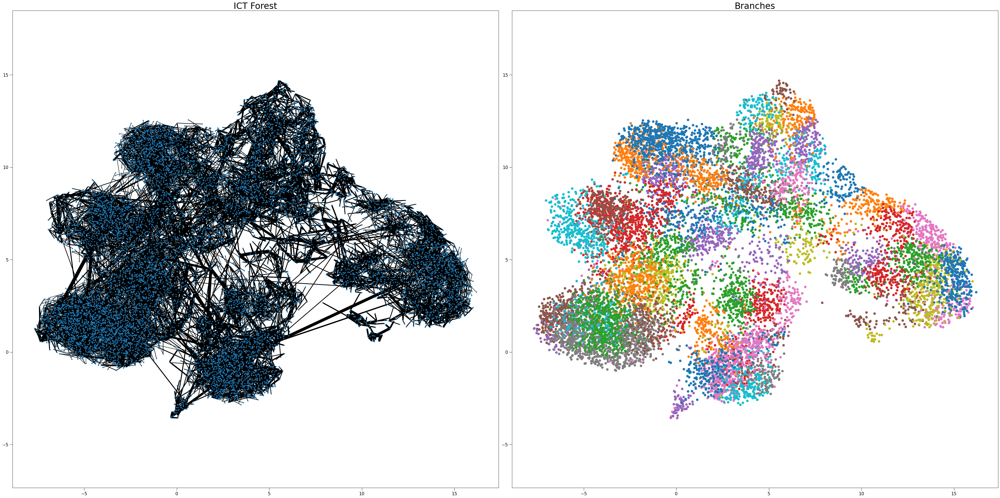

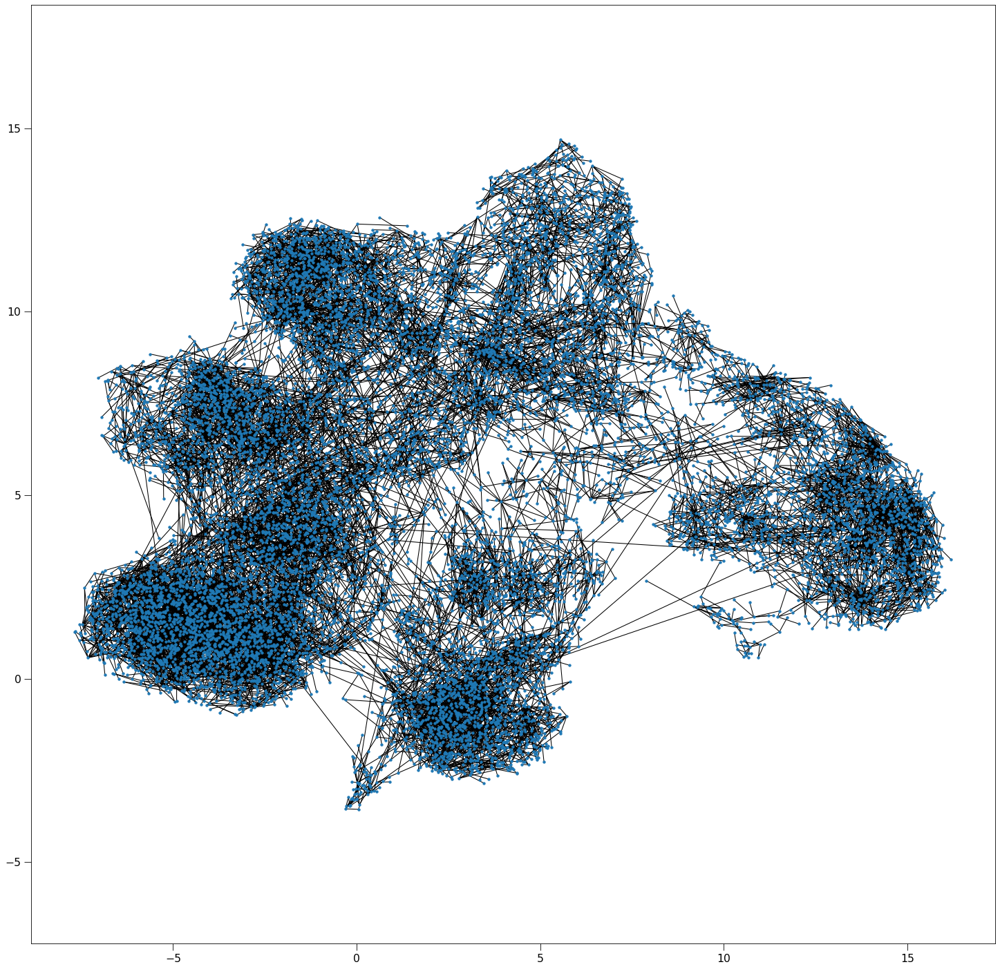

Patching the components together:   0%|          | 0/83 [00:00<?, ?it/s]

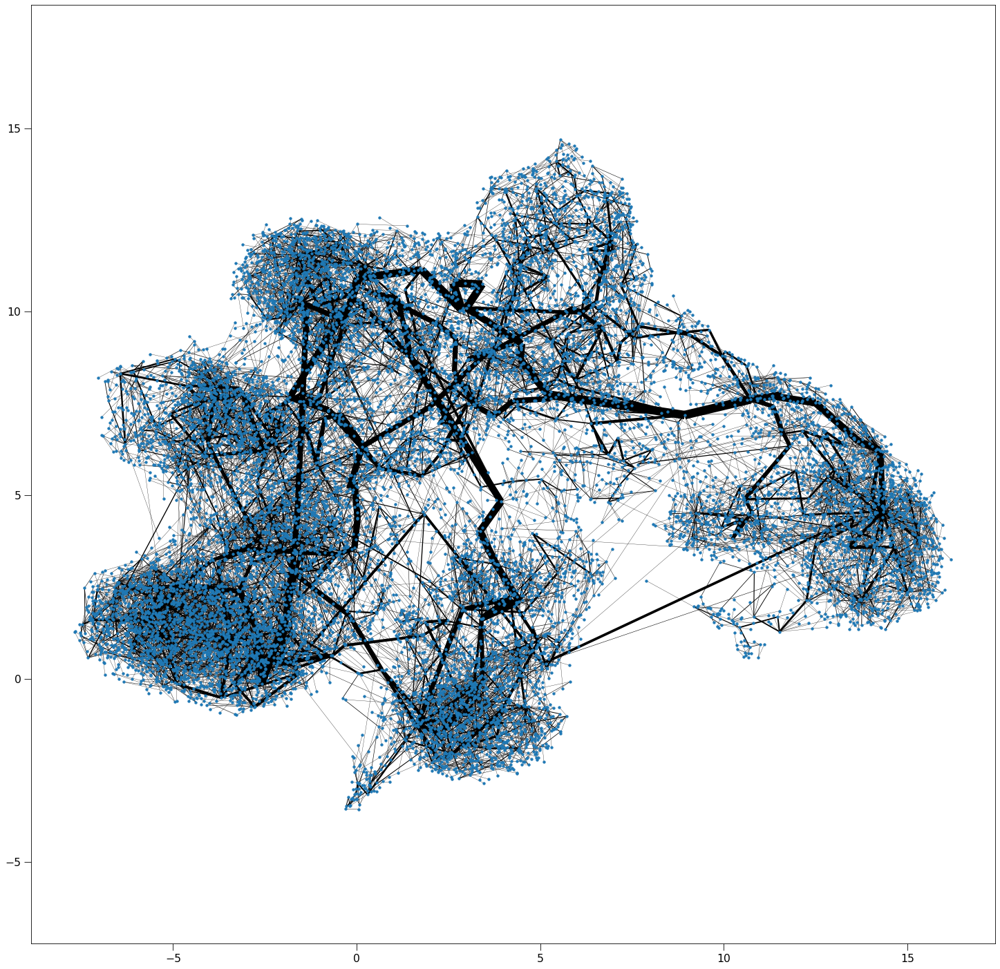

In [10]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 11)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [15]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/14380 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/14380 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

update Arr 14380 -> 13716
update Arr 13716 -> 13715
update Arr 13715 -> 13715
update Arr 13715 -> 13714
update Arr 13714 -> 13712
update Arr 13712 -> 13712
update Arr 13712 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13709
update Arr 13709 -> 13708
update Arr 13708 -> 13708
update Arr 13708 -> 13708
update Arr 13708 -> 13708
update Arr 13708 -> 13707
update Arr 13707 -> 13707
update Arr 13707 -> 13707
update Arr 13707 -> 13706
added 5 edges early


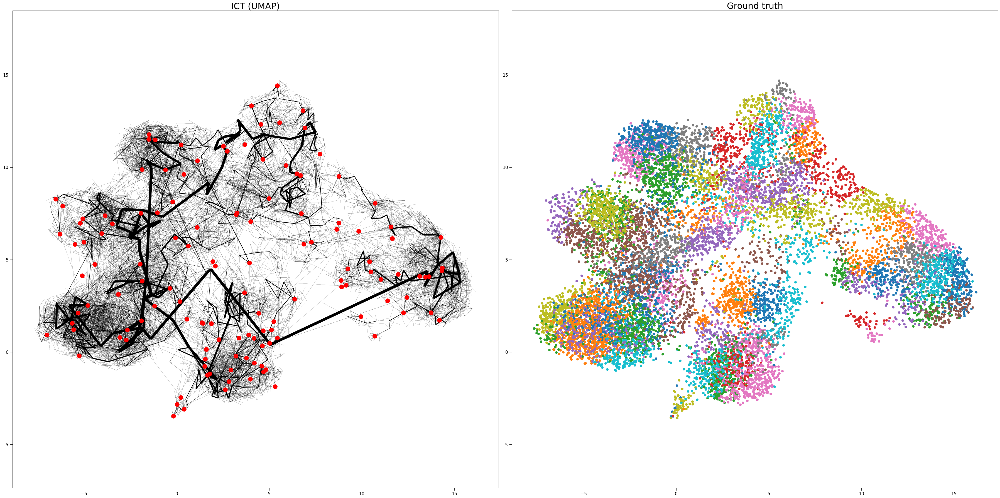

In [16]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

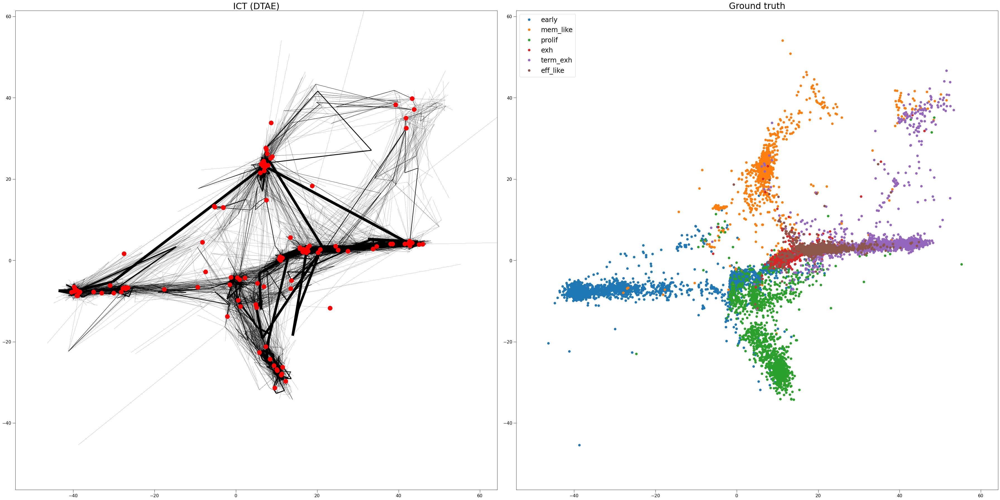

In [17]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

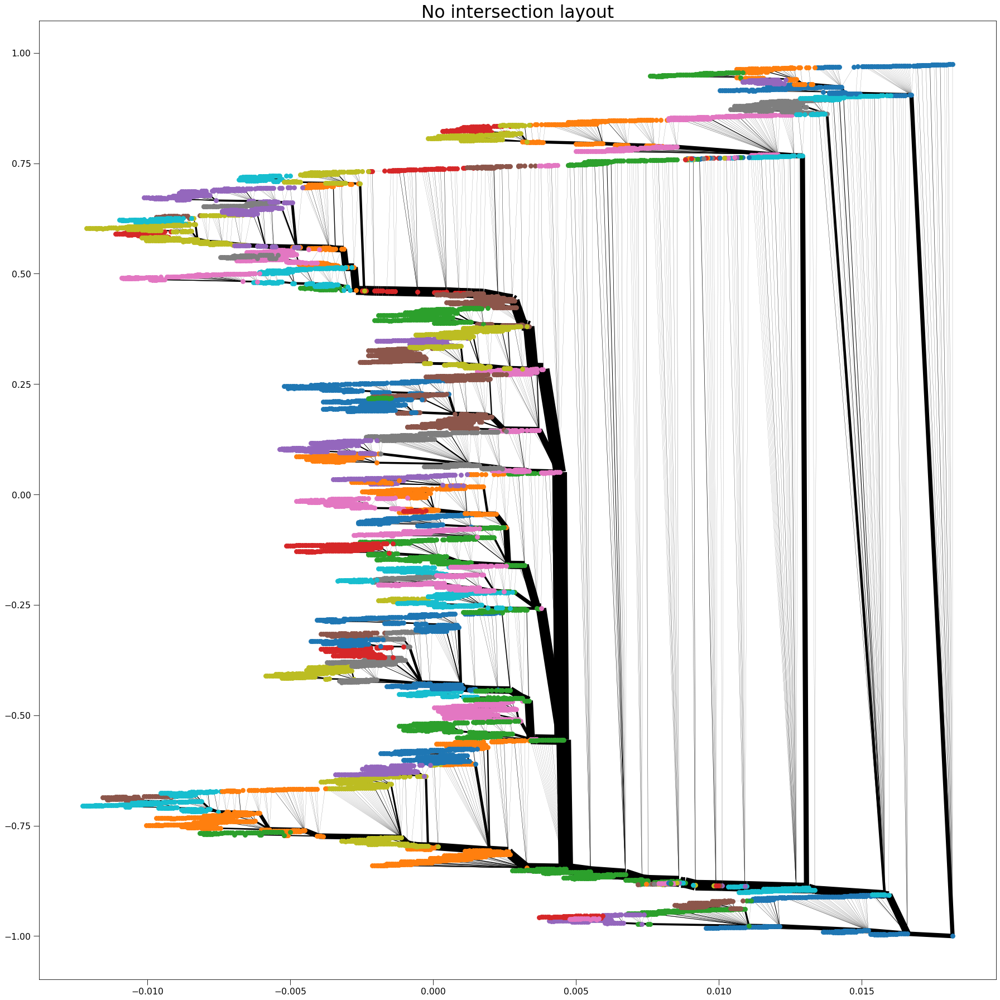

In [18]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()